In [1]:
%load_ext autoreload
%autoreload 2

# Basic setup

In [275]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl
from scipy import sparse

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'DejaVu Sans',
}

# mpl.rcParams['svg.fonttype'] = 'none'
# mpl.rcParams['pdf.fonttype'] = 42

In [3]:
proj_name = "gut_dev_Huycke"
file_name = "gut_dev_Huycke_Jul17-1902"
file_suffix = time.strftime('%b%d-%H%M')

save_dir = Path(f"../save/{proj_name}-{file_suffix}")
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)

seed = 0
ccd.ul.set_seed(seed)

In [4]:
# load the data
adata = sc.read_h5ad(data_dir / f"{file_name}_final.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 65468 × 18701
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.5', 'seurat_clusters', 'PercentMito', 'RNA_snn_res.1', 'LaneID', 'MULTI', 'SinDubNeg', 'Age', 'Mouse', 'SegPos', 'RNA_snn_res.5', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'Age_Mouse', 'Age_Pos', 'CellType_Coarse', 'SCT_snn_res.0.8', 'Classification', 'MouseAge', 'SegmentPos', 'MouseAge_combined', 'batch', 'mes_subtype', 'cell_type', 'epi_subtype', 'mes_BN', 'tcf_signaling_response_wnt_score', 'epi_wnt_group', 'MitoFraction', 'seg_classify', 'S_score', 'G2M_score', 'phase', 'broad_cell_type', 'stage', 'leiden_global_Concord', 'mac_subtype'
    var: 'gene_short_name'
    uns: 'LaneID_colors', 'MouseAge_combined_colors', 'batch_colors', 'broad_cell_type_colors', 'cell_type_colors', 'epi_subtype_colors', 'leiden_global_Concord', 'leiden_global_Concord_colors', 'log1p', 'mes_subtype_colors', 'neighbors', 'phase_colors', 'seg_classify_colors', 'stage_colors'
    obsm: 

In [6]:
# Define color palette for broad_cell_type
_, _, celltype_pal = ccd.pl.get_color_mapping(adata, 'cell_type', pal='Set1', seed=seed)
_, _, broad_celltype_pal = ccd.pl.get_color_mapping(adata, 'broad_cell_type', pal='Set1', seed=seed)
_, _, phase_pal = ccd.pl.get_color_mapping(adata, 'phase', pal='Set1', seed=seed)

pal = {"cell_type": celltype_pal,
    "broad_cell_type": broad_celltype_pal,
    'phase': phase_pal,}

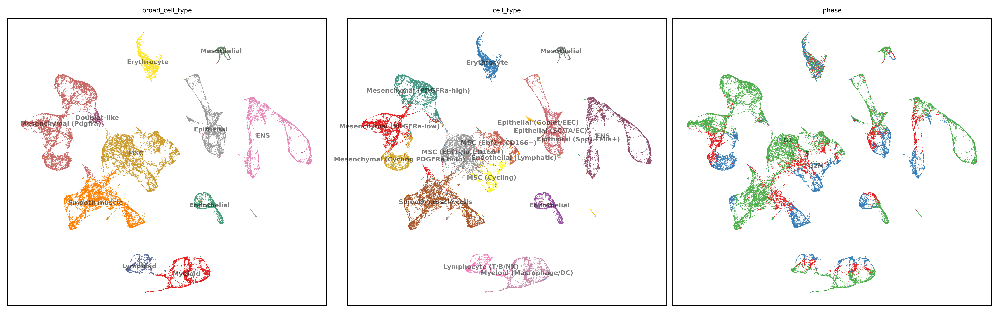

In [99]:
# basis = 'concord_hcl'
basis = 'concord_knn'
show_basis = basis + '_UMAP'
show_cols = ['broad_cell_type', 'cell_type', 'phase']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,4), dpi=600, ncols=3, font_size=6, point_size=1, legend_loc="on data",
    pal=pal,
    save_path=None,
)

In [ ]:
# basis = 'concord_hcl'
basis = 'concord_knn'
show_basis = basis + '_UMAP'
show_cols = ['broad_cell_type', 'cell_type', 'phase']
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,4), dpi=600, ncols=3, font_size=6, point_size=1, legend_loc="on data",
    pal=pal,
    save_path=None,
)

In [8]:
# s_genes = [
#     'MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7',
#     'DTL', 'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN',
#     'WDR76', 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45',
#     'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B',
#     'BRIP1', 'E2F8'
# ]
# g2m_genes = [
#     'HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 'NUF2',
#     'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2',
#     'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1',
#     'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2',
#     'KIF23', 'HMMR', 'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3',
#     'GAS2L3', 'CBX5', 'CENPA'
# ]

# s_genes = ccd.ul.get_mouse_genes(s_genes)
# g2m_genes = ccd.ul.get_mouse_genes(g2m_genes)

s_genes = [
    'Rad51', 'Cdc45', 'Pcna', 'Mcm5', 'Clspn', 'Chaf1b', 'Ubr7', 'Wdr76', 'Usp1', 'Tyms', 'Atad2', 
    'Casp8ap2', 'Pola1', 'Slbp', 'Dtl', 'Fen1', 'Ccne2', 'Blm', 'Gmnn', 'Rfc2', 'Rrm1', 'Tipin', 
    'Rpa2', 'Hells', 'Brip1', 'Mcm4', 'Rrm2', 'Nasp', 'Uhrf1', 'Dscc1', 'Exo1', 'Rad51ap1', 'Gins2', 
    'Ung', 'Prim1', 'Cdca7', 'E2f8', 'Mcm2', 'Cdc6', 'Mcm6', 'Msh2'
]

g2m_genes = [
    'Gtse1', 'Ccnb2', 'Ckap2', 'Tpx2', 'Ttk', 'Ndc80', 'Aurka', 'Gas2l3', 'Tubb4b', 'Aurkb', 'Kif11', 
    'Hmgb2', 'Nuf2', 'G2e3', 'Nek2', 'Rangap1', 'Kif23', 'Nusap1', 'Dlgap5', 'Hjurp', 'Birc5', 'Cdc25c', 
    'Kif2c', 'Tacc3', 'Ect2', 'Cenpe', 'Cbx5', 'Cdk1', 'Ncapd2', 'Cks2', 'Hmmr', 'Cdca3', 'Ctcf', 
    'Bub1', 'Mki67', 'Cdca2', 'Cdc20', 'Lbr', 'Kif20b', 'Cks1brt', 'Anln', 'Tmpo', 'Ckap5', 'Ckap2l', 
    'Psrc1', 'Smc4', 'Top2a', 'Anp32e', 'Cenpa', 'Cenpf', 'Cdca8'
]

cell_cycle_genes = s_genes + g2m_genes

In [9]:
genes_present = [g for g in cell_cycle_genes if g in adata.var_names]
print(f"{len(genes_present)} genes found in adata.")

92 genes found in adata.


In [38]:
adata.obs['cell_type'].unique()

['Endothelial', 'Mesothelial', 'MSC (Ebf1+,CD166+)', 'MSC (Cycling)', 'Mesenchymal (PDGFRa-low)', ..., 'Mesenchymal (PDGFRa-high)', 'Mesenchymal (Cycling PDGFRa hi/lo)', 'ENS', 'Epithelial (Goblet/EEC)', 'Endothelial (Lymphatic)']
Length: 17
Categories (17, object): ['ENS', 'Endothelial', 'Endothelial (Lymphatic)', 'Epithelial (Goblet/EEC)', ..., 'Mesenchymal (PDGFRa-low)', 'Mesothelial', 'Myeloid (Macrophage/DC)', 'Smooth muscle cells']

In [176]:
def plot_cell_cycle_heatmap(adata_subset, s_genes, g2m_genes, title=None, ax=None):
    """
    Plot a cell cycle heatmap on a given axis.
    """
    phase_order = ["G1", "S", "G2M"]

    # Filter valid phases
    adata_sorted = adata_subset[adata_subset.obs['phase'].isin(phase_order)].copy()
    adata_sorted.obs['phase'] = pd.Categorical(adata_sorted.obs['phase'], categories=phase_order, ordered=True)
    adata_sorted = adata_sorted[adata_sorted.obs.sort_values("phase").index].copy()

    # Filter genes
    s_genes_ordered = [g for g in s_genes if g in adata_sorted.var_names]
    g2m_genes_ordered = [g for g in g2m_genes if g in adata_sorted.var_names]
    gene_order = s_genes_ordered + g2m_genes_ordered

    if len(gene_order) == 0 or adata_sorted.n_obs == 0:
        print("❌ No valid genes or cells found.")
        return

    # Z-score matrix
    expr = adata_sorted[:, gene_order].X
    if not isinstance(expr, np.ndarray):
        expr = expr.toarray()
    df_z = pd.DataFrame(expr, index=adata_sorted.obs_names, columns=gene_order).apply(zscore, axis=0)

    # Use provided axis or create one
    if ax is None:
        fig, ax = plt.subplots(figsize=(14, 10))

    # Plot heatmap
    sns.heatmap(
        df_z,
        ax=ax,
        cmap="viridis",
        vmin=-2,
        vmax=2,
        cbar=False,
        xticklabels=True,
        yticklabels=False
    )

    # Rotate gene labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=6)

    # Add phase labels
    phase_counts = adata_sorted.obs['phase'].value_counts(sort=False)
    phase_start_idx = np.cumsum([0] + list(phase_counts[:-1]))
    phase_mid_idx = phase_start_idx + phase_counts.values / 2
    for label, y in zip(phase_order, phase_mid_idx):
        ax.text(
            x=-0.5, y=y, s=label, color='black',
            va='center', ha='right', fontsize=8, fontweight='bold', transform=ax.transData
        )

    ax.set_title(title or "Cell Cycle Heatmap", fontsize=10, pad=6)


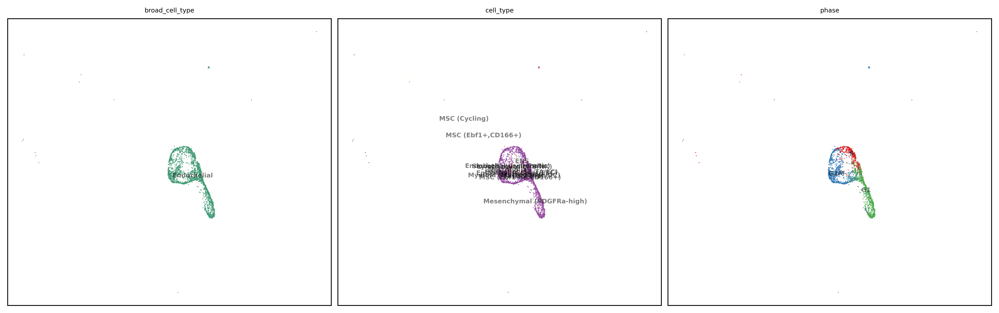

In [102]:
# plot UMAP of the endothelial cell subset in the concord_knn embedding
adata_endothelial = adata[adata.obs['broad_cell_type'] == 'Endothelial'].copy()
basis = 'concord_knn'
show_basis = basis + '_UMAP'
show_cols = ['broad_cell_type', 'cell_type', 'phase']       
ccd.pl.plot_embedding(
    adata_endothelial, show_basis, show_cols, figsize=(13,4), dpi=600, ncols=3, font_size=6, point_size=3, legend_loc="on data",
    pal=pal,
    save_path=None,
)

In [103]:
adata_endothelial

AnnData object with n_obs × n_vars = 2647 × 18701
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.5', 'seurat_clusters', 'PercentMito', 'RNA_snn_res.1', 'LaneID', 'MULTI', 'SinDubNeg', 'Age', 'Mouse', 'SegPos', 'RNA_snn_res.5', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'Age_Mouse', 'Age_Pos', 'CellType_Coarse', 'SCT_snn_res.0.8', 'Classification', 'MouseAge', 'SegmentPos', 'MouseAge_combined', 'batch', 'mes_subtype', 'cell_type', 'epi_subtype', 'mes_BN', 'tcf_signaling_response_wnt_score', 'epi_wnt_group', 'MitoFraction', 'seg_classify', 'S_score', 'G2M_score', 'phase', 'broad_cell_type', 'stage', 'leiden_global_Concord', 'mac_subtype'
    var: 'gene_short_name'
    uns: 'LaneID_colors', 'MouseAge_combined_colors', 'batch_colors', 'broad_cell_type_colors', 'cell_type_colors', 'epi_subtype_colors', 'leiden_global_Concord', 'leiden_global_Concord_colors', 'log1p', 'mes_subtype_colors', 'neighbors', 'phase_colors', 'seg_classify_colors', 'stage_colors'
    obsm: '

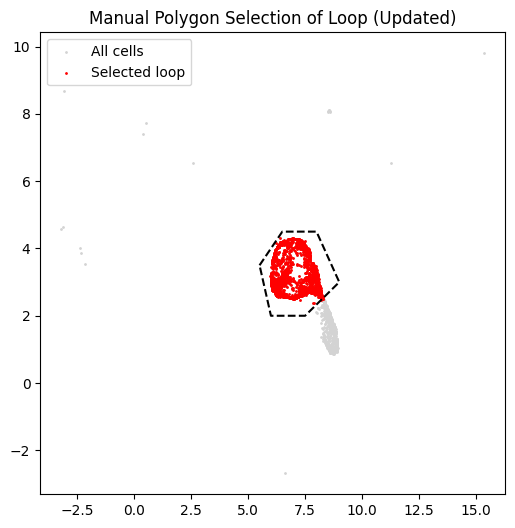

In [162]:
from matplotlib.path import Path
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Coordinates (e.g., UMAP)
X = adata_endothelial.obsm['concord_knn_UMAP']

# Step 2: Define updated polygon
polygon = np.array([
    [5.5, 3.5],
    [6.5, 4.5],
    [8.0, 4.5],
    [9.0, 3.0],
    [7.5, 2.0],
    [6.0, 2.0],
    [5.5, 3.5]  # closing the loop
])
path = Path(polygon)

# Step 3: Find points inside polygon
mask = path.contains_points(X)
adata_endo_loop = adata_endothelial[mask].copy()

# Step 4: Plot result
plt.figure(figsize=(6, 6))
plt.scatter(X[:, 0], X[:, 1], c='lightgray', s=1, label='All cells')
plt.scatter(X[mask, 0], X[mask, 1], c='red', s=1, label='Selected loop')
plt.plot(polygon[:, 0], polygon[:, 1], 'k--')  # draw loop
plt.legend()
plt.title("Manual Polygon Selection of Loop (Updated)")
plt.show()


In [163]:
adata_endo_loop

AnnData object with n_obs × n_vars = 1966 × 18701
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.5', 'seurat_clusters', 'PercentMito', 'RNA_snn_res.1', 'LaneID', 'MULTI', 'SinDubNeg', 'Age', 'Mouse', 'SegPos', 'RNA_snn_res.5', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'Age_Mouse', 'Age_Pos', 'CellType_Coarse', 'SCT_snn_res.0.8', 'Classification', 'MouseAge', 'SegmentPos', 'MouseAge_combined', 'batch', 'mes_subtype', 'cell_type', 'epi_subtype', 'mes_BN', 'tcf_signaling_response_wnt_score', 'epi_wnt_group', 'MitoFraction', 'seg_classify', 'S_score', 'G2M_score', 'phase', 'broad_cell_type', 'stage', 'leiden_global_Concord', 'mac_subtype', 'dbscan'
    var: 'gene_short_name'
    uns: 'LaneID_colors', 'MouseAge_combined_colors', 'batch_colors', 'broad_cell_type_colors', 'cell_type_colors', 'epi_subtype_colors', 'leiden_global_Concord', 'leiden_global_Concord_colors', 'log1p', 'mes_subtype_colors', 'neighbors', 'phase_colors', 'seg_classify_colors', 'stage_colors', 

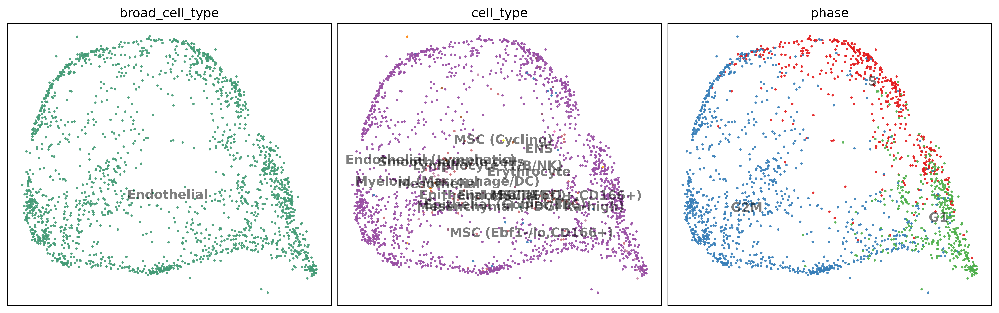

In [171]:
ccd.pl.plot_embedding(
    adata_endo_loop, show_basis, show_cols, figsize=(13,4), dpi=600, ncols=3, font_size=12, point_size=20, legend_loc="on data",
    pal=pal,
    save_path=None,
)

In [164]:
adata_endo_loop.obs['phase'].value_counts()

phase
G2M    1082
S       465
G1      419
Name: count, dtype: int64

In [165]:
# UMAP coordinates for loop cells
X_loop = adata_endo_loop.obsm['concord_knn_UMAP']

# Step 1: Choose a center — either geometric or manual
center = X_loop.mean(axis=0)  # or set manually like np.array([5.5, 3.0])


In [166]:
# Center the coordinates
X_centered = X_loop - center

# Compute angles (arctangent2 gives full 360°)
angles = np.arctan2(X_centered[:, 1], X_centered[:, 0])  # returns in radians
angles = (angles + 2 * np.pi) % (2 * np.pi)  # convert to [0, 2π] range


In [168]:
# Store in .obs
adata_endo_loop.obs['loop_angle'] = angles

# Optional: order cells by angle (ascending)
adata_endo_loop.obs['loop_order'] = angles.argsort().argsort()  # 0 to N-1


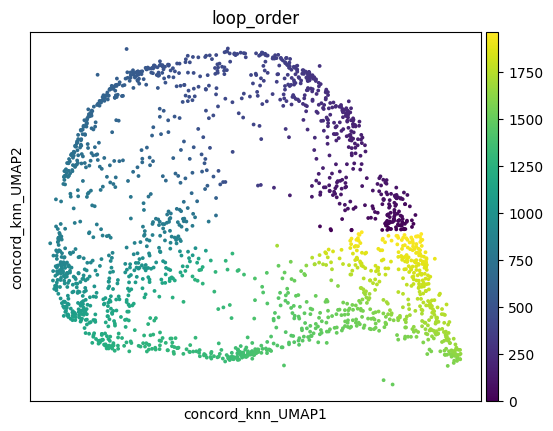

In [170]:
sc.pl.embedding(
    adata_endo_loop,
    basis='concord_knn_UMAP',
    color='loop_order',
    color_map='viridis',     # or 'plasma', 'turbo', 'Spectral' for better gradient
    size=30,
    show=True
)

In [194]:
adata_endo_loop

AnnData object with n_obs × n_vars = 1966 × 18701
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.5', 'seurat_clusters', 'PercentMito', 'RNA_snn_res.1', 'LaneID', 'MULTI', 'SinDubNeg', 'Age', 'Mouse', 'SegPos', 'RNA_snn_res.5', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'Age_Mouse', 'Age_Pos', 'CellType_Coarse', 'SCT_snn_res.0.8', 'Classification', 'MouseAge', 'SegmentPos', 'MouseAge_combined', 'batch', 'mes_subtype', 'cell_type', 'epi_subtype', 'mes_BN', 'tcf_signaling_response_wnt_score', 'epi_wnt_group', 'MitoFraction', 'seg_classify', 'S_score', 'G2M_score', 'phase', 'broad_cell_type', 'stage', 'leiden_global_Concord', 'mac_subtype', 'dbscan', 'loop_angle', 'loop_order'
    var: 'gene_short_name'
    uns: 'LaneID_colors', 'MouseAge_combined_colors', 'batch_colors', 'broad_cell_type_colors', 'cell_type_colors', 'epi_subtype_colors', 'leiden_global_Concord', 'leiden_global_Concord_colors', 'log1p', 'mes_subtype_colors', 'neighbors', 'phase_colors', 'seg_classi

In [188]:
# Ensure loop_order is numeric
adata_endo_loop.obs['loop_order'] = pd.to_numeric(adata_endo_loop.obs['loop_order'])

# Sort AnnData by loop_order
adata_endo_loop_sorted = adata_endo_loop[adata_endo_loop.obs.sort_values("loop_order").index].copy()


In [234]:
import pandas as pd
adata_endo_loop.obs['loop_bin'] = pd.qcut(
    adata_endo_loop.obs['loop_order'], 
    q=4,  # or 3/5/etc. depending on desired resolution
    labels=["Q1", "Q2", "Q3", "Q4"]
)


In [235]:
import scanpy as sc

sc.tl.rank_genes_groups(
    adata_endo_loop, 
    groupby='loop_bin', 
    method='wilcoxon', 
    use_raw=False
)


In [236]:
# cross tab adata_endo_loop.obs['loop_bin'], adata_endo_loop.obs['phase']
pd.crosstab(adata_endo_loop.obs['loop_bin'], adata_endo_loop.obs['phase'], margins=True, margins_name="Total").style.background_gradient(cmap='viridis')

phase,G1,G2M,S,Total
loop_bin,,,,
Q1,62,45,385,492
Q2,0,452,39,491
Q3,13,474,4,491
Q4,344,111,37,492
Total,419,1082,465,1966


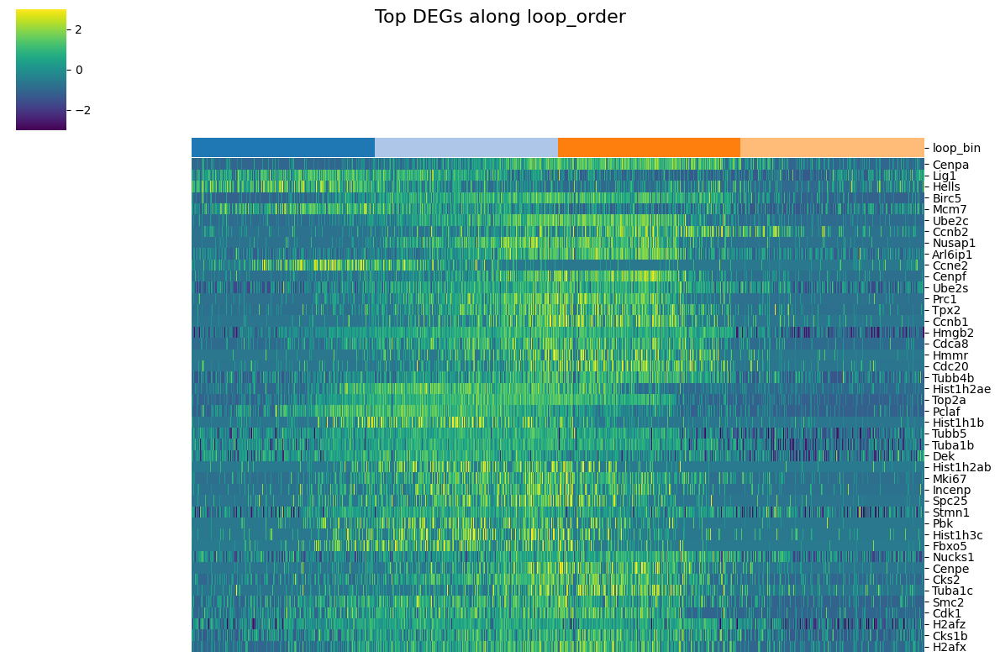

In [237]:
degs = sc.get.rank_genes_groups_df(adata_endo_loop, group=None)
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract top N DEGs per loop_bin
degs_df = sc.get.rank_genes_groups_df(adata_endo_loop, group=None)  # all loop_bin groups
top_n = 20

top_genes = (
    degs_df
    .groupby("group")
    .apply(lambda x: x.nsmallest(top_n, "pvals_adj"))
    .reset_index(drop=True)["names"]
    .unique()
    .tolist()
)

# Step 2: Subset AnnData to top DEGs and z-score
adata_degs = adata_endo_loop[:, top_genes].copy()
X = adata_degs.X.toarray() if hasattr(adata_degs.X, "toarray") else adata_degs.X
X_z = zscore(X, axis=0)
adata_degs.layers["zscore"] = X_z

# Step 3: Order cells by loop_order
adata_degs.obs["loop_order_rank"] = adata_degs.obs["loop_order"].rank(method="first")
adata_degs = adata_degs[adata_degs.obs.sort_values("loop_order_rank").index].copy()

# Step 4: Plot heatmap
palette = sns.color_palette("tab20", len(adata_degs.obs['loop_bin'].unique()))
pal = {"loop_bin": dict(zip(adata_degs.obs['loop_bin'].cat.categories, palette))}

with plt.rc_context(rc=custom_rc):
    ccd.pl.heatmap_with_annotations(
        adata=adata_degs,
        val="zscore",
        transpose=True,
        obs_keys=["loop_bin"],
        pal=pal,
        use_clustermap=True,
        cluster_rows=False,
        cluster_cols=False,
        cmap=sns.color_palette("viridis", as_cmap=True),
        row_scale=False,
        clip_limits=(-3, 3),
        rasterize=True,
        title="Top DEGs along loop_order",
        figsize=(12, 8),
        save_path=None,
        show=True
    )



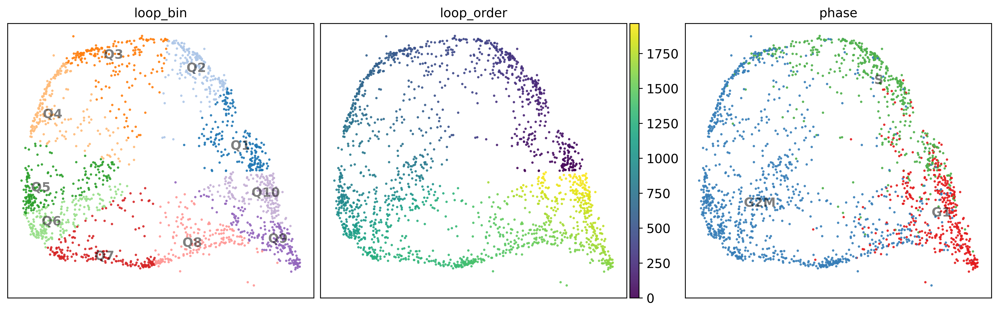

In [233]:
# plot the adata_endo_loop labeled by loop_bin
ccd.pl.plot_embedding(
    adata_endo_loop, 
    show_basis, 
    color_by = ['loop_bin', 'loop_order', 'phase'], 
    figsize=(13,4), 
    dpi=600, 
    ncols=3, 
    font_size=12, 
    point_size=20, 
    legend_loc="on data",
    pal=pal,
    save_path=None,
)


----

In [238]:
adata_endo_loop

AnnData object with n_obs × n_vars = 1966 × 18701
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.5', 'seurat_clusters', 'PercentMito', 'RNA_snn_res.1', 'LaneID', 'MULTI', 'SinDubNeg', 'Age', 'Mouse', 'SegPos', 'RNA_snn_res.5', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'Age_Mouse', 'Age_Pos', 'CellType_Coarse', 'SCT_snn_res.0.8', 'Classification', 'MouseAge', 'SegmentPos', 'MouseAge_combined', 'batch', 'mes_subtype', 'cell_type', 'epi_subtype', 'mes_BN', 'tcf_signaling_response_wnt_score', 'epi_wnt_group', 'MitoFraction', 'seg_classify', 'S_score', 'G2M_score', 'phase', 'broad_cell_type', 'stage', 'leiden_global_Concord', 'mac_subtype', 'dbscan', 'loop_angle', 'loop_order', 'loop_bin'
    var: 'gene_short_name'
    uns: 'LaneID_colors', 'MouseAge_combined_colors', 'batch_colors', 'broad_cell_type_colors', 'cell_type_colors', 'epi_subtype_colors', 'leiden_global_Concord', 'leiden_global_Concord_colors', 'log1p', 'mes_subtype_colors', 'neighbors', 'phase_colors',

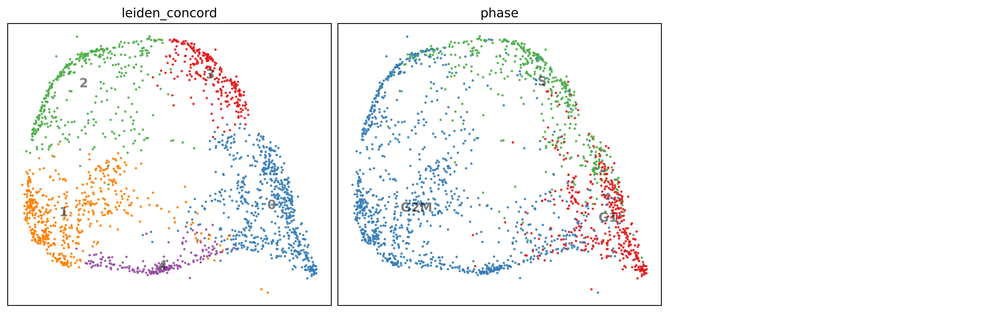

In [255]:
import scanpy as sc

# Step 1: Set the latent space you want to use
adata_endo_loop.obsm['X_leiden'] = adata_endo_loop.obsm['concord_knn']

# Step 2: Create a neighbor graph from the latent
sc.pp.neighbors(adata_endo_loop, use_rep='X_leiden', n_neighbors=15)

# Step 3: Run Leiden clustering
sc.tl.leiden(adata_endo_loop, resolution=0.2, key_added='leiden_concord')

# Step 4: Plot the Leiden clusters on the UMAP
ccd.pl.plot_embedding(
    adata_endo_loop, 
    show_basis, 
    color_by = ['leiden_concord', 'phase'], 
    figsize=(13,4), 
    dpi=600, 
    ncols=3, 
    font_size=12, 
    point_size=20, 
    legend_loc="on data",
    save_path=None,
)

In [256]:
adata_endo_loop

AnnData object with n_obs × n_vars = 1966 × 18701
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.5', 'seurat_clusters', 'PercentMito', 'RNA_snn_res.1', 'LaneID', 'MULTI', 'SinDubNeg', 'Age', 'Mouse', 'SegPos', 'RNA_snn_res.5', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1', 'Age_Mouse', 'Age_Pos', 'CellType_Coarse', 'SCT_snn_res.0.8', 'Classification', 'MouseAge', 'SegmentPos', 'MouseAge_combined', 'batch', 'mes_subtype', 'cell_type', 'epi_subtype', 'mes_BN', 'tcf_signaling_response_wnt_score', 'epi_wnt_group', 'MitoFraction', 'seg_classify', 'S_score', 'G2M_score', 'phase', 'broad_cell_type', 'stage', 'leiden_global_Concord', 'mac_subtype', 'dbscan', 'loop_angle', 'loop_order', 'loop_bin', 'leiden_concord', 'leiden_loop_ordered'
    var: 'gene_short_name'
    uns: 'LaneID_colors', 'MouseAge_combined_colors', 'batch_colors', 'broad_cell_type_colors', 'cell_type_colors', 'epi_subtype_colors', 'leiden_global_Concord', 'leiden_global_Concord_colors', 'log1p', 'mes_subt

In [270]:
# Step 1: Define custom mapping
# Replace keys with original Leiden cluster labels and values with desired labels based on loop_order
leiden_manual_map = {
    '0': 'C1',
    '3': 'C2',
    '2': 'C3',
    '1': 'C4',
    '4': 'C5',
    # ... continue as needed
}

# Step 2: Apply the mapping
adata_endo_loop.obs['leiden_loop_ordered'] = (
    adata_endo_loop.obs['leiden_concord'].map(leiden_manual_map)
)

# Step 3: Set as categorical with order (optional, for plotting consistency)
custom_order = list(leiden_manual_map.values())  # ['C1', 'C2', ...] in your preferred order
adata_endo_loop.obs['leiden_loop_ordered'] = pd.Categorical(
    adata_endo_loop.obs['leiden_loop_ordered'],
    categories=custom_order,
    ordered=True
)

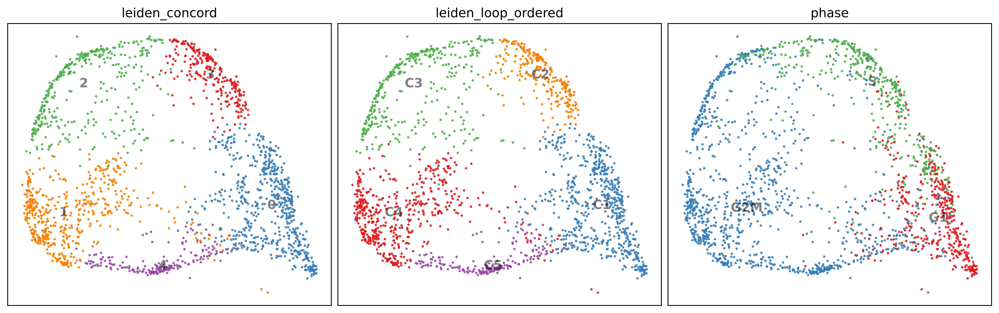

In [298]:
# Step 4: Plot the Leiden clusters on the UMAP
ccd.pl.plot_embedding(
    adata_endo_loop, 
    show_basis, 
    color_by = ['leiden_concord', 'leiden_loop_ordered', 'phase'], 
    figsize=(13,4), 
    dpi=600, 
    ncols=3, 
    font_size=12, 
    point_size=20, 
    pal=pal,
    legend_loc="on data",
    save_path=save_dir / f"{proj_name}_leiden_clusters.png",
)

In [277]:
import scanpy as sc

sc.tl.rank_genes_groups(
    adata_endo_loop, 
    groupby='leiden_loop_ordered', 
    method='wilcoxon', 
    use_raw=False
)


In [296]:
# cross tab adata_endo_loop.obs['leiden_concord'], adata_endo_loop.obs['phase']
pd.crosstab(adata_endo_loop.obs['leiden_loop_ordered'], adata_endo_loop.obs['phase'], 
            margins=True, margins_name="Total").style.background_gradient(cmap='viridis', axis=None)   

phase,G1,G2M,S,Total
leiden_loop_ordered,,,,
C1,384,102,128,614
C2,13,18,229,260
C3,1,273,100,374
C4,11,494,6,511
C5,10,195,2,207
Total,419,1082,465,1966


58 top DEGs extracted across leiden_loop_ordered clusters.


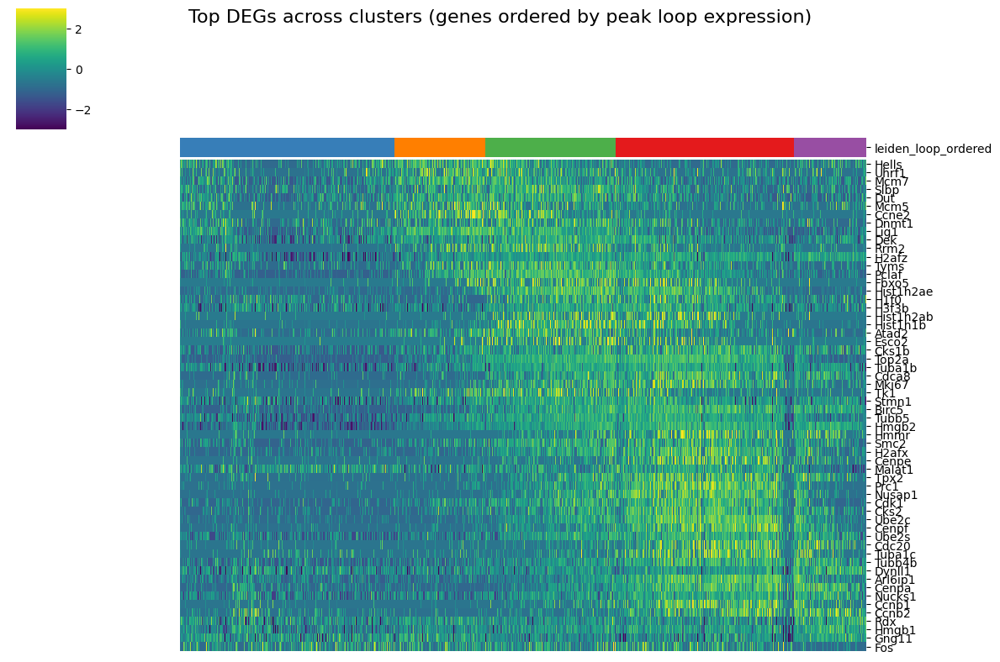

In [297]:
import scanpy as sc
import numpy as np
import pandas as pd
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract top N DEGs per leiden cluster
degs_df = sc.get.rank_genes_groups_df(adata_endo_loop, group=None)
top_n = 20
top_genes = (
    degs_df
    .groupby("group")
    .apply(lambda x: x.nsmallest(top_n, "pvals_adj"))
    .reset_index(drop=True)["names"]
    .unique()
    .tolist()
)
print(f"{len(top_genes)} top DEGs extracted across leiden_loop_ordered clusters.")

# Step 2: Subset AnnData and compute z-score
adata_degs = adata_endo_loop[:, top_genes].copy()
X = adata_degs.X.toarray() if hasattr(adata_degs.X, "toarray") else adata_degs.X
adata_degs.layers["zscore"] = zscore(X, axis=0)

# Step 3: Order cells by leiden_loop_ordered and loop_order
adata_degs.obs["leiden_order"] = adata_degs.obs["leiden_loop_ordered"].cat.codes
adata_degs.obs["sort_key"] = adata_degs.obs["leiden_order"] + adata_degs.obs["loop_order"] * 1e-4
adata_degs = adata_degs[adata_degs.obs.sort_values("sort_key").index].copy()

# Step 4: Use predefined peak-sorting function on zscore matrix
# Prepare adata_degs.obsm["zscore"] for function input
adata_degs.obsm["zscore"] = adata_degs.layers["zscore"]
loop_path = np.argsort(adata_degs.obs["loop_order"].values)

sorted_data, _, _, sorted_columns = ccd.ul.sort_and_smooth_signal_along_path(
    adata_degs,
    signal_key="zscore",
    path=loop_path,
    sigma=2
)

# Step 5: Reorder genes in AnnData object
adata_degs = adata_degs[:, sorted_columns].copy()

# Step 6: Define palette for clusters
# unique_clusters = adata_degs.obs['leiden_loop_ordered'].cat.categories
# palette = sns.color_palette("tab20", len(unique_clusters))
# pal = {"leiden_loop_ordered": dict(zip(unique_clusters, palette))}

_, _, pal = ccd.pl.get_color_mapping(adata_degs, 'leiden_loop_ordered', pal='Set1', seed=seed)

# Step 7: Plot
with plt.rc_context(rc=custom_rc):
    ccd.pl.heatmap_with_annotations(
        adata=adata_degs,
        val="zscore",
        transpose=True,
        obs_keys=["leiden_loop_ordered"],
        pal=pal,
        use_clustermap=True,
        cluster_rows=False,
        cluster_cols=False,
        cmap=sns.color_palette("viridis", as_cmap=True),
        row_scale=False,
        clip_limits=(-3, 3),
        rasterize=True,
        title="Top DEGs across clusters (genes ordered by peak loop expression)",
        figsize=(12, 8),
        save_path=save_dir / f"{proj_name}_top_degs_heatmap.png",
        show=True
    )
